# Customized pix2pix GAN
This notebook is based on the original tensorflow pix2pix GAN: https://www.tensorflow.org/tutorials/generative/pix2pix

## Theory

To quantify the effect of the generator input random z-vector, we can calculate the gradient of the network output $y$ with respect to the input random z-vector ($z$):

$$
\frac{dy}{dz}
$$

$y$ is a 256 x 256 x 3 vector. $z$ is a 256 x 256 vector. This means that $\frac{dy}{dz}$ has 256 x 256 x 3 x 256 x 256 = 12,884,901,888 values. This is too large to store/calculate. But we can calculate:

$$
|\frac{dy}{dz}|,
$$

which is the magnitude of the derivative.

In [1]:
import tensorflow as tf
import os
import time
from matplotlib import pyplot as plt
from matplotlib.image import imread
from IPython import display
import numpy as np
from PIL import Image, ImageDraw, ImageFont
import glob
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 9103239158057560498
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 4986830848
locality {
  bus_id: 1
  links {
  }
}
incarnation: 14424614523401795457
physical_device_desc: "device: 0, name: NVIDIA GeForce GTX 1660 Ti, pci bus id: 0000:01:00.0, compute capability: 7.5"
]


## Enable saving to Google Drive if working with colab, to external SSD, or disable if saving locally

In [2]:
def save_to(save = "locally"):
  if save == "colab":
    from google.colab import drive
    drive.mount('/content/drive')
    %cd drive/MyDrive/Colab Notebooks/drones
  elif save == "ssd":
    os.chdir("D:/GanNoMask")

In [3]:
save_to("ssd")

## Batch size impact
The optimal value for batch size lies within 1 and sample size. 1 is good for the training accuracy, but bad for the variance in the generated output. At the same time, sample size is a number which would be restricted by the memory. The tested specifications suggest that the potentially better values for the batch size are 8, 10, 20.

In [4]:
BUFFER_SIZE = 2520
BATCH_SIZE = 20
IMG_WIDTH = 256
IMG_HEIGHT = 256
OUTPUT_CHANNELS = 3
EPOCHS = 400

## Load the image from file

In [5]:
def load(image_file):
  image = tf.io.read_file(image_file)
  image = tf.io.decode_png(image)
  w = tf.shape(image)[1]
  real_image = image[:, :w, :]
  real_image = tf.cast(real_image, tf.float32)
  return real_image

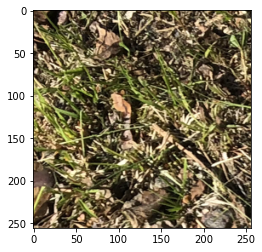

In [6]:
re = load("C:/Users/romat/Desktop/rotatest/000001.png")
plt.figure()
plt.imshow(re/255.0)

## Random mirroring and jittering of the images

In [7]:
def resize(real_image, height, width):
  real_image = tf.image.resize(real_image, [height, width], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  return real_image

In [8]:
def random_crop(real_image):
  cropped_image = tf.image.random_crop(real_image, size=[IMG_HEIGHT, IMG_WIDTH, 3])
  return cropped_image

In [9]:
def normalize(real_image):
  real_image = (real_image / 127.5) - 1
  return real_image

In [10]:
@tf.function()
def random_jitter(real_image):
  # Resizing to 286 x 286 x 3
  real_image = resize(real_image, 286, 286)
  # Randomly cropping to 256 x 256 x 3
  real_image = random_crop(real_image)
  if tf.random.uniform(()) > 0.5:
    # Random mirroring
    real_image = tf.image.flip_left_right(real_image)
  return real_image

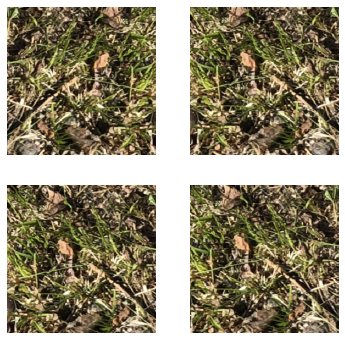

In [11]:
plt.figure(figsize=(6, 6))
for i in range(4):
  rj_re = random_jitter(re)
  plt.subplot(2, 2, i+1)
  plt.imshow(rj_re/255.0)
  plt.axis('off')
plt.show()

## Select train and test images

In [12]:
def load_image_train(image_file):
  real_image = load(image_file)
  real_image = random_jitter(real_image)
  real_image = normalize(real_image)
  return real_image

In [13]:
def load_image_test(image_file):
  real_image = load(image_file)
  real_image = resize(real_image, IMG_HEIGHT, IMG_WIDTH)
  real_image = normalize(real_image)
  return real_image

Autotune use may very here depending on the version of tensorflow. The original pix2pix paper uses tensorflow.1.

In [14]:
train_dataset = tf.data.Dataset.list_files("C:/Users/romat/Desktop/rotatest/*.png")
AUTOTUNE = tf.data.experimental.AUTOTUNE
train_dataset = train_dataset.map(load_image_train, num_parallel_calls=AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)
len(list(train_dataset))

252

## Define the downsampling and upsampling
Print the shape of the sample image layer after downsampling and upsampling

In [15]:
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)
  result = tf.keras.Sequential()
  result.add(tf.keras.layers.Conv2D(filters, 
                                    size, 
                                    strides=2, 
                                    padding='same', 
                                    kernel_initializer=initializer, 
                                    use_bias=False))
  if apply_batchnorm: 
    result.add(tf.keras.layers.BatchNormalization())
  result.add(tf.keras.layers.LeakyReLU())
  return result

In [16]:
down_model = downsample(3, 4)
down_result = down_model(tf.expand_dims(re, 0))
print (down_result.shape)

(1, 128, 128, 3)


In [17]:
def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)
  result = tf.keras.Sequential()
  result.add(tf.keras.layers.Conv2DTranspose(filters, 
                                             size, 
                                             strides=2, 
                                             padding='same', 
                                             kernel_initializer=initializer, 
                                             use_bias=False))
  result.add(tf.keras.layers.BatchNormalization())
  if apply_dropout:
    result.add(tf.keras.layers.Dropout(0.5))
  result.add(tf.keras.layers.ReLU())
  return result

In [18]:
up_model = upsample(3, 4)
up_result = up_model(down_result)
print (up_result.shape)

(1, 256, 256, 3)


## Define and create a random noise and coordinates vectors
Unlike in pix2pix, we do not have the capacities to manually label all the masks. Therefore, we use a single-channel random noise vector as an input to the Generator, and a vector of X&Y coordinates to both the Generator and Discriminator.

In [19]:
def random_noise(batch_size, img_width, img_height):
    noise_vector = tf.random.uniform([batch_size, img_width, img_height, 1]) * 16
    return noise_vector

In [20]:
def coordinates(batch_size, img_width, img_height):
    X, Y = tf.meshgrid(tf.convert_to_tensor(np.arange(img_width)), 
                       tf.convert_to_tensor(np.arange(img_height)))
    coordinate_vector = tf.constant(np.repeat(normalize(tf.cast(tf.expand_dims(tf.stack([X, Y], axis = -1), axis = 0), tf.float32)), batch_size, axis = 0))
    return coordinate_vector

In [21]:
z = random_noise(BATCH_SIZE, IMG_WIDTH, IMG_HEIGHT)
coord = coordinates(BATCH_SIZE, IMG_WIDTH, IMG_HEIGHT)

## Define the Generator. Plot the Generator training pipeline diagram.
Generator uses two inputs: 1-channel random noise vector and vector of x&y coordinates. Then the layers are concatenated. The resulted 3-channel layer is a subject to downsampling, with a following forwarding of the downsampled layer to a skip connection. After the input is fully downsampled, the upsampling begins, with the concatenation of the layers forwarded respectively with skip connection.

In [22]:
def Generator():
  z = tf.keras.layers.Input(shape=[256, 256, 1], name='z_vector')
  coordinates = tf.keras.layers.Input(shape=[256, 256, 2], name='coordinates')
  x = tf.keras.layers.Concatenate()([z, coordinates])

  down_stack = [
    downsample(64, 4, apply_batchnorm=False),  # (bs, 128, 128, 64)
    downsample(128, 4),  # (bs, 64, 64, 128)
    downsample(256, 4),  # (bs, 32, 32, 256)
    downsample(512, 4),  # (bs, 16, 16, 512)
    downsample(512, 4),  # (bs, 8, 8, 512)
    downsample(512, 4),  # (bs, 4, 4, 512)
    downsample(512, 4),  # (bs, 2, 2, 512)
    downsample(512, 4),  # (bs, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True),  # (bs, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True),  # (bs, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True),  # (bs, 8, 8, 1024)
    upsample(512, 4),  # (bs, 16, 16, 1024)
    upsample(256, 4),  # (bs, 32, 32, 512)
    upsample(128, 4),  # (bs, 64, 64, 256)
    upsample(64, 4),  # (bs, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (bs, 256, 256, 3)

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=[z, coordinates], outputs=x)

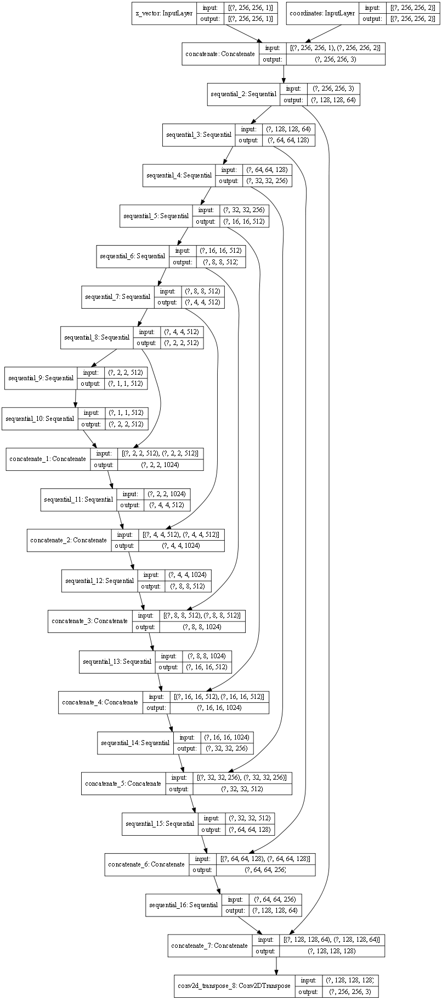

In [23]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

## Plot the Generator output

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


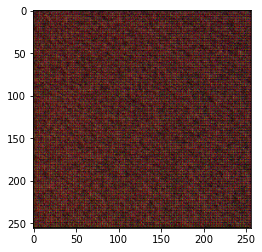

In [24]:
gen_output = generator([z, coord], training=False)
plt.imshow(gen_output[0, ...])

## Define the Generator loss

In [25]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [26]:
def generator_loss(disc_generated_output, gen_output):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)
  return gan_loss

## Define the Discriminator. Plot the Discriminator training pipeline diagram.
Use the X&Y coordinates vector and the target image to create the 30x30 patches, which classify the 70x70 portions of the image (PatchGAN).

In [27]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  coord = tf.keras.layers.Input(shape=[256, 256, 2], name='coordinates')
  tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

  x = tf.keras.layers.concatenate([coord, tar])  # (bs, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x)  # (bs, 128, 128, 64)
  down2 = downsample(128, 4)(down1)  # (bs, 64, 64, 128)
  down3 = downsample(256, 4)(down2)  # (bs, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (bs, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (bs, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (bs, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (bs, 30, 30, 1)

  return tf.keras.Model(inputs=[coord, tar], outputs=last)

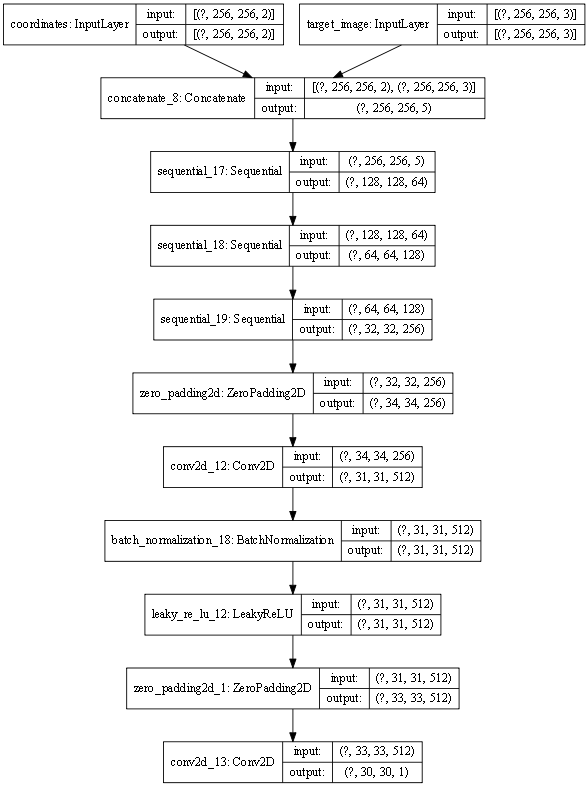

In [28]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

## Plot the patch

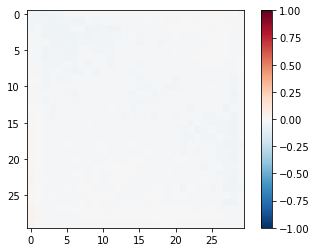

In [29]:
disc_out = discriminator([coord, gen_output], training=False)
plt.imshow(disc_out[0, ..., -1], vmin=-1, vmax=1, cmap='RdBu_r')
plt.colorbar()

## Define discriminator loss

In [30]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

<tf.Tensor: shape=(), dtype=float32, numpy=1.3862944>

Try to replace all with l2 loss

## Create Adam Generator and Discriminator optimizers
Parameters are used from the pix2pix.

In [31]:
def select_optimizer(optimizer):
  if optimizer == "Adam":
    generator_optimizer = tf.keras.optimizers.Adam(1e-5, beta_1 = 0.5, epsilon = 0.01)
    discriminator_optimizer = tf.keras.optimizers.Adam(5e-5, beta_1 = 0.5, epsilon = 0.01)
  elif optimizer == "SGD":
    generator_optimizer = tf.keras.optimizers.SGD(0.005, momentum = 0.9, nesterov = True)
    discriminator_optimizer = tf.keras.optimizers.SGD(0.005, momentum = 0.9, nesterov = True)
  return generator_optimizer, discriminator_optimizer

In [32]:
generator_optimizer = select_optimizer("Adam")[0]
discriminator_optimizer = select_optimizer("Adam")[1]

## Some observations on optimizers
**Adam with 2e-4, beta_1 = 0.5**: Generally, a good default choice. It can be noticed, that the improvements in the predicted image arise when the generator and discriminator losses start fluctuating. This, however, may happend at different point of time. Also, the standard runs are done for 200 epochs, and it may be benefitial to increase the number. <br>
**Adam with epsilon = 0.1 (fit\20210604-101544)**: Both generator and discriminator losses have major fluctuations from the start, which, however, does not lead to the improvement in the prediction image. Potentially needs more runs than 200. <br>
**Adam with epsilon = 0.01 (fit\20210607-152740)**: Seems to recognize shapes quicker than runs with other epsilon values. <br>
**Adam with epsilon = 0.01, beta_1 = 0.35 (fit\20210608-113325)**: "I don't seem to see the difference" (with the above run) - Olli N. <br>
**SGD with 0.005, momentum = 0.9, nesterov = True (fit\20210604-095025)**: Generally, Adam is considered a better default choice for the optimizer, as it is more robust towards settings. However, sometimes, stochastic gradient descents, if chosen with correct parameters, can have more precision and speed. But not in this try. <br>
**Custom Adam with complex momentum**: Something to test.

## Current and latest settings
For the latest trainings, when we switched the dataset from the facades to the manually taken close-up images of the grass, soil and stone and applied cropping, resizing, and copying of the images after rotation. Therefore, the learning rate implications are not inferred from the facades training as we have increased the dataset and we do not have to maintain the horizontal-vertical structure of the images as we did with the facade images. The current settings are **Adam with 1e-4 for Generator and 5e-4 for Discriminator**. However, we also restrict the Discriminator by forbidding it to apply gradients if Discriminator loss is too small.

## A link between the learning rate and the batch size
One of the issues, that persists in this network structure due to passing independent noise vector, is that, at some point of training, the variance in the generated images falls dramatically. One of the ways to address this is to use a higher batch size, which should at least leave more variance between the images within one batch.<br>
Increasing batch size will lead to a "faster but slower" training. In other words, the network will jump quicker to the following epoch, but it will pick up less features. Therefore, increasing number of epochs or increasing the learning rate might be necessary.

## Create checkpoint and logs savers for later inspection of the predictions and losses
By default, the checkpoint is saved once every 30 epochs.

In [33]:
checkpoint_dir = './training_checkpoints_testlatest3'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator=generator,
                                 discriminator=discriminator)
checkpoint.save(file_prefix=checkpoint_prefix)

'./training_checkpoints_testlatest3\\ckpt-1'

In [34]:
def checkpoint_save(epoch, inEpochs = 30):
  if (epoch + 1) % inEpochs == 0:
    checkpoint.save(file_prefix=checkpoint_prefix)

In [35]:
import datetime
log_dir = "logs/"
im_dir = "images/fit" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S") + "/"
os.makedirs(im_dir)
summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

## Define the image generation function. Plot the concatenated random noise and coordinates vectors image, the target image and the model's prediction image. 

In [36]:
def generate_images(model, z, coord, tar, save = False, epoch = 0):
  prediction = model([z[tf.newaxis, ...], coord[tf.newaxis, ...]], training=True)
  plt.figure(figsize=(15, 15))
  
  display_list = [np.concatenate((z, coord), axis = -1), tar[0], prediction[0]]
  title = ['Z Vector', 'Ground Truth', 'Predicted Image']
  
  if save:
    #if (epoch + 1) % 5 == 0:
    name = str(epoch).zfill(4)
    #tf.keras.preprocessing.image.save_img((im_dir + str(name) + ".png"), display_list[2])
    tf.keras.preprocessing.image.save_img((im_dir + str(name) + ".png"), prediction[0])

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


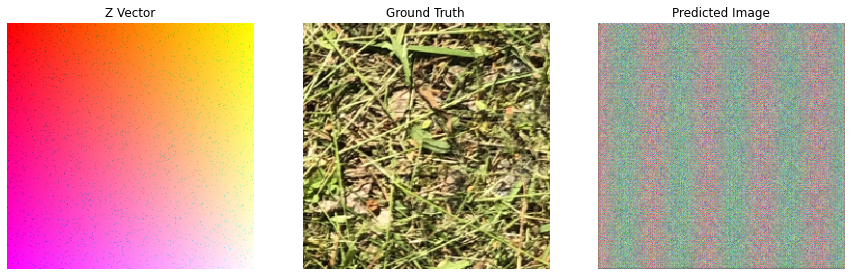

In [37]:
for example_target in train_dataset.take(1):
  z = random_noise(BATCH_SIZE, IMG_WIDTH, IMG_HEIGHT)
  generate_images(generator, z[0], coord[0], example_target, save = False)

## Define the train step
Save losses to tensorboard.

In [38]:
@tf.function
def train_step(z, coord, target, epoch):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator([z, coord], training=True)

    disc_real_output = discriminator([coord, target], training=True)
    disc_generated_output = discriminator([coord, gen_output], training=True)

    gen_gan_loss = generator_loss(disc_generated_output, gen_output)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)
    
    generator_gradients = gen_tape.gradient(gen_gan_loss,
                                          generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)
    
  
  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

  with summary_writer.as_default():
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=epoch)
    tf.summary.scalar('disc_loss', disc_loss, step=epoch)

## Define the fit function
Show one prediction for the random image per epoch. Create basic interface (the interface might not work well if using tensorflow.2). Create checkpoints with the default interval and save the last epoch as well. 

In [39]:
def fit(train_ds, epochs):
  coord = coordinates(BATCH_SIZE, IMG_WIDTH, IMG_HEIGHT)
  for epoch in range(epochs):
    start = time.time()
    tf.keras.backend.clear_session()
    
    display.clear_output(wait=True)
    for example_target in train_ds.take(1):
      z = random_noise(BATCH_SIZE, IMG_WIDTH, IMG_HEIGHT)
      generate_images(generator, z[0], coord[0], example_target, save = True, epoch = epoch)
    print("Epoch: ", epoch)

    # Train
    #somevar = 0
    for n, (target) in train_ds.enumerate():
      print('.', end='')
      if (n+1) % 100 == 0:
        print()
      z = random_noise(BATCH_SIZE, IMG_WIDTH, IMG_HEIGHT)
      train_step(z, coord, target, epoch)
      #if epoch % 50 == 0 or epoch == 999:
        #name = str(somevar).zfill(4)
        #direct = str(epoch).zfill(4)
        #try:
          #os.mkdir("testsetbig/" + direct)
        #except:
          #pass
        #tf.keras.preprocessing.image.save_img(("testsetbig/" + direct + "/" + name + ".png"), 
                                              #generator([z, coord], training=True)[0])
        #somevar += 1
    print()

    checkpoint_save(epoch, 30)
    print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,
                                                        time.time()-start))
    
  checkpoint.save(file_prefix=checkpoint_prefix)

## Initiate tensorboard to view the losses from the runs

In [42]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [45]:
%tensorboard --logdir {log_dir} --host localhost --port 6154

Reusing TensorBoard on port 6154 (pid 11684), started 0:01:01 ago. (Use '!kill 11684' to kill it.)

## Fit the model

In [ ]:
fit(train_dataset, EPOCHS)

Epoch:  90


In [39]:
def load_ckpt(latest = True, number = 1):
  if latest:
    checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))
  else:
    checkpoint.restore('training_checkpoints_testlatest3/ckpt-' + str(number))

In [40]:
load_ckpt(False, 4)

## Plot the predictions for 5 random target images

In [41]:
for tar in train_dataset.take(5):
  z = random_noise(BATCH_SIZE, IMG_WIDTH, IMG_HEIGHT)
  generate_images(generator, z[0], coord[0], tar)

NameError: name 'test_dataset' is not defined

## Plot the evolution of predictions based on the checkpoints
Change the parameters in the range to specify the number of first and last checkpoint to be considered.

In [46]:
for i in range(1, 11):
  load_ckpt(False, i)
  for tar in test_dataset.take(1):
    z = random_noise(BATCH_SIZE, IMG_WIDTH, IMG_HEIGHT)
    generate_images(generator, z[0], coord[0], tar)

## Create gif from the saved images

https://stackoverflow.com/questions/65065373/creating-gifs-from-images-using-pil-in-python

In [53]:
count = 0
frames = []
while count <= 180:
  imgs = glob.glob("D:/GanNoMask/images/fit20210727-101007/*.png")
  for i in imgs:
    name = str(count).zfill(4)
    new_frame = Image.open(i)
    d = ImageDraw.Draw(new_frame)
    d.text((220, 240), name, fill=(230, 0, 0))
    frames.append(new_frame)
    count += 1

  imgs = glob.glob("D:/GanNoMask/images/fit20210727-131815/*.png")
  for i in imgs:
    name = str(count).zfill(4)
    new_frame = Image.open(i)
    d = ImageDraw.Draw(new_frame)
    d.text((220, 240), name, fill=(230, 0, 0))
    frames.append(new_frame)
    count += 1

  imgs = glob.glob("D:/GanNoMask/images/fit20210728-085901/*.png")
  for i in imgs[:30]:
    name = str(count).zfill(4)
    new_frame = Image.open(i)
    d = ImageDraw.Draw(new_frame)
    d.text((220, 240), name, fill=(230, 0, 0))
    frames.append(new_frame)
    count += 1

frames[0].save('postgif.gif', format='GIF',append_images=frames[1:], save_all=True, duration=150, loop=0)

## Capture the impact of the z vector to the generated output

Idea: add a line of the variance in z vector

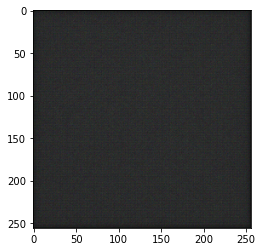

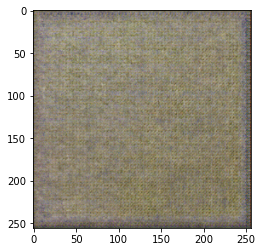

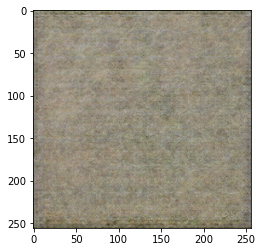

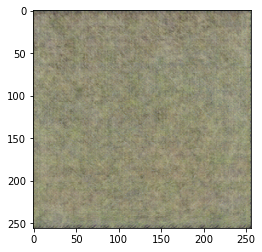

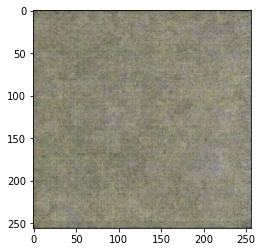

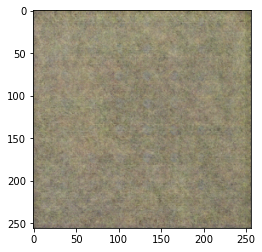

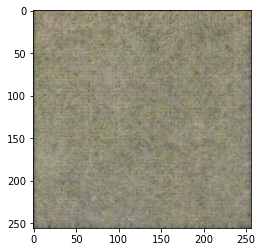

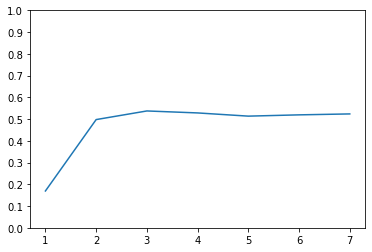

In [46]:
meanarray = []
for i in range(1, 8):
  load_ckpt(False, i) 
  smth = []
  for tar in train_dataset.take(50):
    z = random_noise(BATCH_SIZE, IMG_WIDTH, IMG_HEIGHT)
    #generate_images(generator, z[0], coord[0], tar)
    smth.append(generator([z, coord], training=True)[0])
  a = np.var(smth, axis = 0)
  meanarray.append(np.sqrt(np.mean(a)))
  plt.figure()
  plt.imshow(np.sqrt(a))
  plt.show()
plt.figure()
plt.ylim(0, 1)
plt.yticks(np.arange(0, 1.01, step = 0.1))
plt.xticks(np.arange(1, 8, step = 1))
plt.plot(range(1, 8), meanarray)
plt.show()

## Generate training dataset for HalfGAN

In [45]:
load_ckpt(False, 3)

In [50]:
def generate_images2(model, z, coord, tar, name, save = False):
  prediction = model([z[tf.newaxis, ...], coord[tf.newaxis, ...]], training=True)
  #plt.figure(figsize=(15, 15))
  
  display_list = [np.concatenate((z, coord), axis = -1), tar[0], prediction[0]]
  title = ['Z Vector', 'Ground Truth', 'Predicted Image']
  
  if save:
    #if (epoch + 1) % 5 == 0:
    #tf.keras.preprocessing.image.save_img((im_dir + str(name) + ".png"), display_list[2])
    tf.keras.preprocessing.image.save_img(("D:/GanNoMask/fulltrain2/" + str(name) + ".png"), prediction[0])

  #for i in range(3):
    #plt.subplot(1, 3, i+1)
    #plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    #plt.imshow(display_list[i] * 0.5 + 0.5)
    #plt.axis('off')
  #plt.show()

In [51]:
for i in range(3000):
  for tar in train_dataset.take(1):
    z = random_noise(BATCH_SIZE, IMG_WIDTH, IMG_HEIGHT)
    name = str(i).zfill(6)
    generate_images2(generator, z[0], coord[0], tar, name = name, save = True)

In [50]:
def variance(directory):
  imagearr = []
  for image in os.listdir(directory):
    image = imread(directory + "/" + image)
    imagearr.append(image)
  a = np.var(imagearr, axis = 0)
  print(np.sqrt(np.mean(a)))
  plt.figure()
  plt.imshow(np.sqrt(a))
  plt.show()

0.26186785


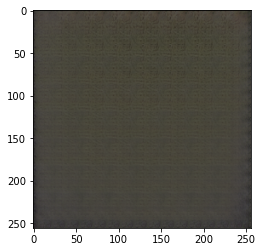

0.27048552


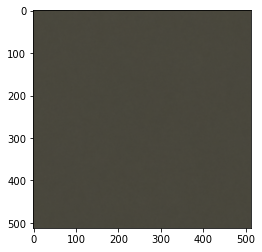

In [51]:
variance("D:/GanNoMask/fulltrain")
variance("C:/Users/romat/Desktop/rotatetrain")